<a href="https://colab.research.google.com/github/kazars24/ds-school-final-project/blob/main/FinalProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center>**Финальный проект** </center>

## Постановка задачи


Предсказать, является ли рак доброкачественным или злокачественным.
Целевая переменная *diagnosis* имеет два значения: B и M (доброкачественная и злокачественная соответственно).


## Описание данных

- `id` -- идентификационный номер каждого наблюдения.
- `diagnosis` -- целевая переменная.
- `radius` -- среднее расстояние от центра до точек по периметру.
- `texture` -- стандартное отклонение значений серой шкалы.
- `perimeter` -- периметр клетки.
- `area` -- площадь клетки.
- `smoothness` -- локальное изменение длин радиусов.
- `compactness` -- периметр^2 / площадь - 1.0.
- `concavity` -- выраженность вогнутых участков контура.
- `concave points` -- количество вогнутых участков контура.
- `symmetry` -- симметрия.
- `fractal_dimension` -- "приближение береговой линии" - 1.

Среднее значение, стандартная ошибка и "наихудшее" или наибольшее (среднее из трех
наибольших значений) этих признаков были вычислены для каждого изображения, в
результате чего было получено 30 признаков. Например, поле 3-это средний радиус, поле
13-Радиус SE, поле 23-Наихудший радиус.

##  Первичный анализ данных

In [ ]:
from __future__ import division, print_function
# отключим всякие предупреждения Anaconda
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [ ]:
df = pd.read_csv("data.csv")
print(df.shape)
df.head()

(569, 33)


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [ ]:
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [ ]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


Так как `id` не пригодится в построении модели, то этот признак можно удалить.

Признак `Unnamed: 32` не несет абсолютно никакой информации, а всего его значения это NaN, то этот признак тоже можно удалить.

In [ ]:
df = df.drop(['Unnamed: 32','id'], axis = 1)
df.shape

(569, 31)

## Первичный визуальный анализ признаков

In [ ]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 

sns.set(context='notebook', style='darkgrid', palette='deep', font='sans-serif', font_scale=1, color_codes=False, rc=None)

In [ ]:
cols = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
        'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
        'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

sns.pairplot(df[cols], hue="diagnosis", palette='inferno')
plt.savefig('pairplot_mean1.png')

In [ ]:
cols = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
        'area_mean', 'smoothness_mean']

sns.pairplot(df[cols], hue="diagnosis", palette='inferno')
plt.savefig('pairplot_mean2.png')

In [ ]:
cols = ['diagnosis', 'radius_se', 'texture_se', 'perimeter_se',
        'area_se', 'smoothness_se']
sns.pairplot(df[cols], hue="diagnosis", palette='inferno')
plt.savefig('pairplot_se.png')

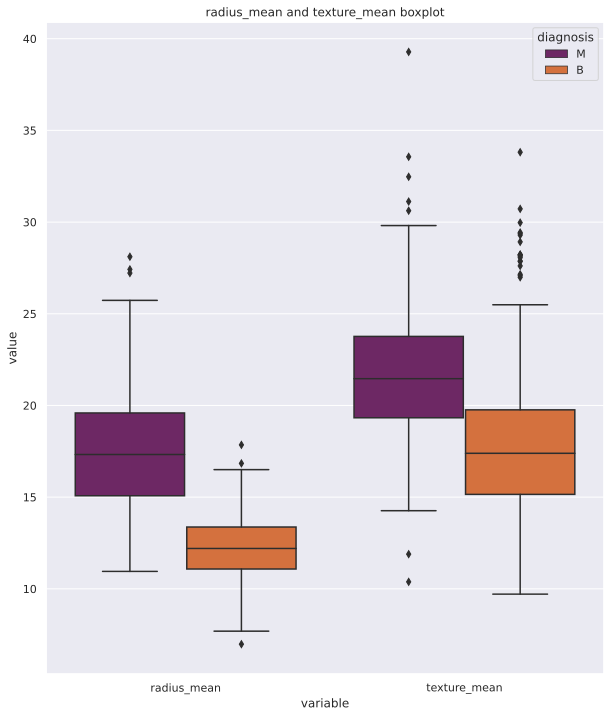

<Figure size 432x288 with 0 Axes>

In [ ]:
# преобразую некоторые столбцы в строки с измеряемыми значениями
melted_df = pd.melt(df, id_vars = "diagnosis",
                    value_vars = ['radius_mean', 'texture_mean'])
plt.figure(figsize = (10,12))
sns.boxplot(x = "variable", y = "value", hue="diagnosis",data= melted_df,
            palette='inferno')
plt.title('radius_mean and texture_mean boxplot')
plt.show()
plt.savefig('boxplot.png')

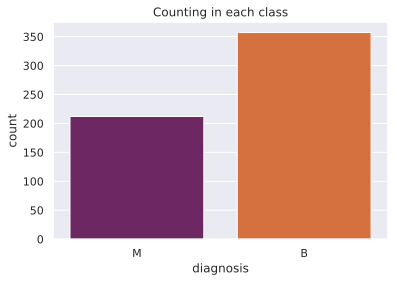

In [ ]:
sns.countplot(x='diagnosis', data=df, palette='inferno')
plt.title('Counting in each class')
plt.savefig('countplot.png')

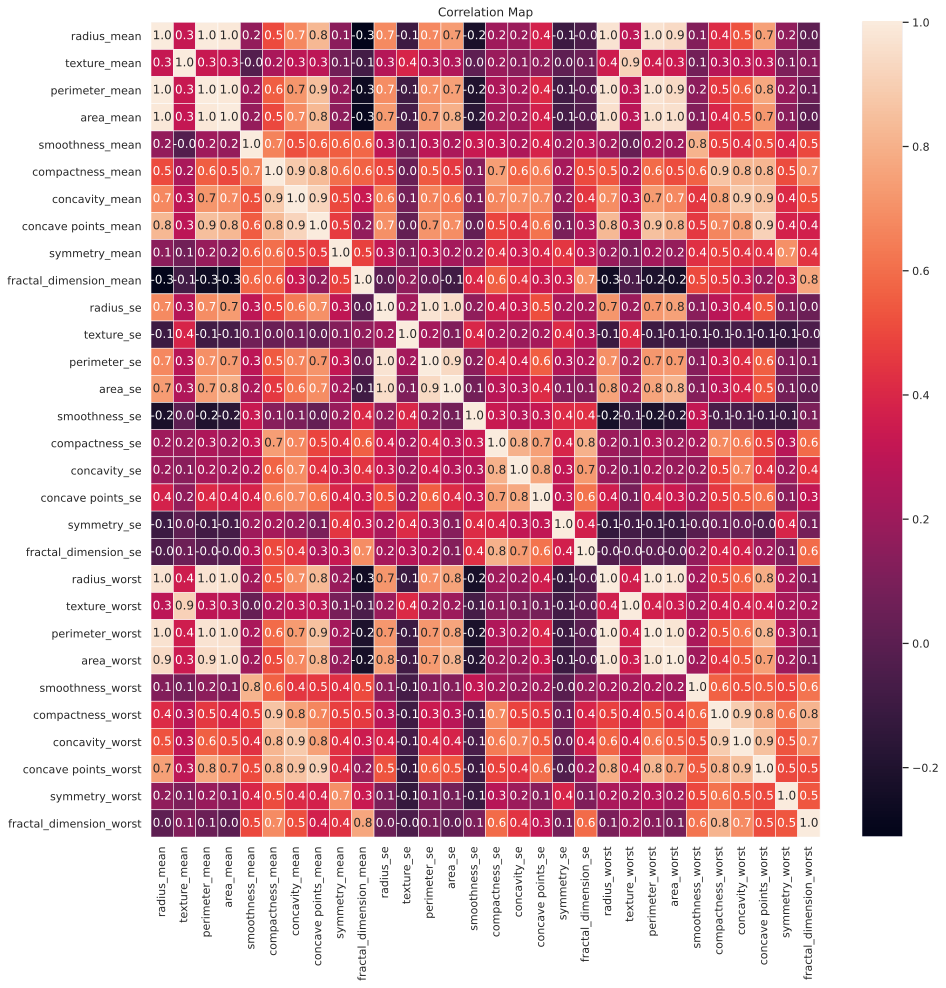

<Figure size 432x288 with 0 Axes>

In [ ]:
f, ax=plt.subplots(figsize = (15,15))
sns.heatmap(df.corr(), annot=True, linewidths=0.5, fmt=".1f", ax=ax)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.title('Correlation Map')
plt.show()
plt.savefig('heatmap.png')

По графикам можно заметить, что такие фичи, как радиус, периметр и площадь (особенно средние значения) связаны между собой и находятся в прямой зависимости друг от друга, соответственно они сильно скоррелированные (1.0).

Кроме того, среднее значение, стандартная ошибка и "наихудшее" у некоторых признаков тоже сильно скорррелированные.

Наблюдений класса B больше чем M, но значения класса B у многих фичей выше, чем у класса M.

## Отбор и преобразование признаков

In [ ]:
y = df['diagnosis']
X = df.drop('diagnosis', axis = 1)

In [ ]:
def correlation(data, limit):
    col_corr = set() # набор имен столбцов
    corr_matrix = data.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j]) > limit: 
                col_name = corr_matrix.columns[i] # получение имени столбца
                col_corr.add(col_name)
    return col_corr

In [ ]:
corr_features = correlation(X, 0.9)
print(len(corr_features))
print(corr_features)
# удаляем сильно скоррелированные фичи
X = X.drop(corr_features, axis=1) 
X.head()

10
{'radius_worst', 'perimeter_mean', 'area_worst', 'texture_worst', 'area_se', 'perimeter_se', 'area_mean', 'concave points_worst', 'perimeter_worst', 'concave points_mean'}


,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,compactness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,0.11840,0.27760,0.3001,0.2419,0.07871,1.0950,0.9053,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,0.1622,0.6656,0.7119,0.4601,0.11890
1,20.57,17.77,0.08474,0.07864,0.0869,0.1812,0.05667,0.5435,0.7339,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,0.1238,0.1866,0.2416,0.2750,0.08902
2,19.69,21.25,0.10960,0.15990,0.1974,0.2069,0.05999,0.7456,0.7869,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,0.1444,0.4245,0.4504,0.3613,0.08758
3,11.42,20.38,0.14250,0.28390,0.2414,0.2597,0.09744,0.4956,1.1560,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,0.2098,0.8663,0.6869,0.6638,0.17300
4,20.29,14.34,0.10030,0.13280,0.1980,0.1809,0.05883,0.7572,0.7813,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,0.1374,0.2050,0.4000,0.2364,0.07678


In [ ]:
def outliers_z_score(data, threshold=3): # проверяем данные на выбросы
    x = data.values
    mean_x = np.mean(x)
    std_x = np.std(x)
    z_scores = [(xi - mean_x) / std_x for xi in x]
    outliers = x[np.where(np.abs(z_scores) > threshold)]
    return outliers

In [ ]:
 for col in X.columns:
   out = outliers_z_score(X[col])
   # выведем долю выбросов по каждому признаку
   print(col, ':', len(out) / X.shape[0])

radius_mean : 0.008787346221441126
texture_mean : 0.007029876977152899
smoothness_mean : 0.008787346221441126
compactness_mean : 0.015817223198594025
concavity_mean : 0.015817223198594025
symmetry_mean : 0.008787346221441126
fractal_dimension_mean : 0.012302284710017574
radius_se : 0.012302284710017574
texture_se : 0.015817223198594025
smoothness_se : 0.012302284710017574
compactness_se : 0.0210896309314587
concavity_se : 0.01054481546572935
concave points_se : 0.01054481546572935
symmetry_se : 0.019332161687170474
fractal_dimension_se : 0.01757469244288225
smoothness_worst : 0.005272407732864675
compactness_worst : 0.01757469244288225
concavity_worst : 0.012302284710017574
symmetry_worst : 0.015817223198594025
fractal_dimension_worst : 0.015817223198594025


Фичи с большим кол-вом выбросов отсутствуют.

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_columns = X.columns
X=scaler.fit_transform(X)
X = pd.DataFrame(X, columns=X_columns)
X.head()

,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,compactness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst
0,1.097064,-2.073335,1.568466,3.283515,2.652874,2.217515,2.255747,2.489734,-0.565265,-0.214002,1.316862,0.724026,0.660820,1.148757,0.907083,1.307686,2.616665,2.109526,2.750622,1.937015
1,1.829821,-0.353632,-0.826962,-0.487072,-0.023846,0.001392,-0.868652,0.499255,-0.876244,-0.605351,-0.692926,-0.440780,0.260162,-0.805450,-0.099444,-0.375612,-0.430444,-0.146749,-0.243890,0.281190
2,1.579888,0.456187,0.942210,1.052926,1.363478,0.939685,-0.398008,1.228676,-0.780083,-0.297005,0.814974,0.213076,1.424827,0.237036,0.293559,0.527407,1.082932,0.854974,1.152255,0.201391
3,-0.768909,0.253732,3.283553,3.402909,1.915897,2.867383,4.910919,0.326373,-0.110409,0.689702,2.744280,0.819518,1.115007,4.732680,2.047511,3.394275,3.893397,1.989588,6.046041,4.935010
4,1.750297,-1.151816,0.280372,0.539340,1.371011,-0.009560,-0.562450,1.270543,-0.790244,1.483067,-0.048520,0.828471,1.144205,-0.361092,0.499328,0.220556,-0.313395,0.613179,-0.868353,-0.397100


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3,
                                                    stratify = y,
                                                    random_state = 17)

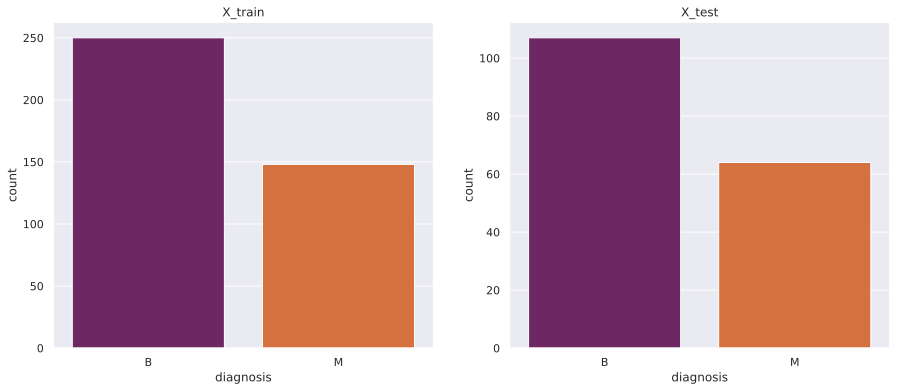

<Figure size 432x288 with 0 Axes>

In [ ]:
# проверка на сбалансированность обучающей и тестовой выборок
plt.figure(figsize=(15, 6))

plt.subplot(121)
sns.countplot(x=y_train, data=X_train, palette='inferno')
plt.title('X_train')

plt.subplot(122)
sns.countplot(x=y_test, data=X_test, palette='inferno')
plt.title('X_test')

plt.show()
plt.savefig('balance.png')

## Обучение модели классификации

### **KNN**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_val_score, RandomizedSearchCV

In [ ]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=5)

param_grid = [
              {'n_neighbors': range(1, 15),
               'weights': ['uniform', 'distance'],
               'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
               'leaf_size': range(1, 25),
               'metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski',
                          'seuclidean', 'mahalanobis']}
]

knn_cv = GridSearchCV(KNeighborsClassifier(), param_grid, cv=skf,
                           scoring='roc_auc', verbose=True, n_jobs=-1)
knn_cv.fit(X_train, y_train)

Fitting 5 folds for each of 16128 candidates, totalling 80640 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 7416 tasks      | elapsed:   35.1s
[Parallel(n_jobs=-1)]: Done 23416 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 45816 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 74616 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 80640 out of 80640 | elapsed:  5.3min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=5, shuffle=True),
             error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=-1,
             param_grid=[{'algorithm': ['auto', 'ball_tree', 'kd_tree',
                                        'brute'],
                          'leaf_size': range(1, 25),
                          'metric': ['euclidean', 'manhattan', 'chebyshev',
                                     'minkowski', 'seuclidean', 'mahalanobis'],
                          'n_neighbors': range(1, 15),
                          'weights': ['uniform', 'distance']}],
             pre_dispatch='2*n_jobs', refit=True, return_t

In [ ]:
knn_cv.best_params_

{'algorithm': 'auto',
 'leaf_size': 1,
 'metric': 'manhattan',
 'n_neighbors': 7,
 'weights': 'distance'}

In [ ]:
knn_cv.best_score_

0.9896091954022989

In [ ]:
y_pred = knn_cv.best_estimator_.predict_proba(X_test)
roc_auc_score(y_test, y_pred[:, 1])

0.9862733644859814

In [ ]:
train_roc_auc, test_roc_auc = [], []
for n in  range(1, 15):
  knn = KNeighborsClassifier(algorithm='auto', leaf_size=1, metric='manhattan',
                             n_neighbors=n, weights='distance')
  train_roc_auc.append(mean(cross_val_score(knn, X_train, y_train, cv=skf,
                                            scoring='roc_auc')))
  
  knn.fit(X_train, y_train)
  y_pred = knn.predict_proba(X_test)
  test_score = roc_auc_score(y_test, y_pred[:, 1])
  test_roc_auc.append(test_score)

In [ ]:
print(train_roc_auc)
print(test_roc_auc)

[0.9299770114942527, 0.9741678160919539, 0.9870344827586207, 0.9890666666666666, 0.988464367816092, 0.9890758620689655, 0.9896091954022989, 0.9882114942528736, 0.9863816091954023, 0.9859172413793104, 0.985848275862069, 0.9853701149425287, 0.9845747126436782, 0.9838896551724139]
[0.9141355140186916, 0.9770005841121495, 0.9869304906542056, 0.9878066588785047, 0.9879526869158879, 0.9872955607476636, 0.9862733644859814, 0.9915303738317758, 0.991676401869159, 0.9915303738317757, 0.9910922897196262, 0.9903621495327103, 0.9891939252336449, 0.9890478971962616]


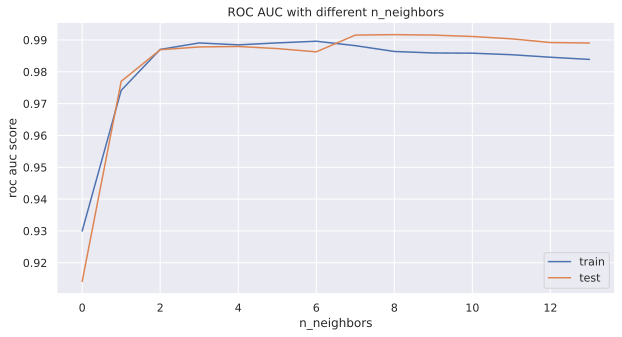

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize = (10,5))
plt.plot(train_roc_auc, label='train')
plt.plot(test_roc_auc, label='test')
plt.xlabel('n_neighbors')
plt.ylabel('roc auc score')
plt.legend(loc="lower right")
plt.title('ROC AUC with different n_neighbors')
plt.show()
plt.savefig('knn.png')

In [ ]:
knn_classifier = KNeighborsClassifier(algorithm='auto', leaf_size=1,
                                      metric='manhattan', n_neighbors=9,
                                      weights='distance')
knn_classifier.fit(X_train, y_train)
test_pred = knn_classifier.predict_proba(X_test)
roc_auc_score(y_test, test_pred[:, 1])

0.991676401869159

### **LogisticRegression**

In [ ]:
from sklearn.linear_model import LogisticRegression

params = [
          {'penalty': ['l1', 'l2', 'elasticnet', 'none'],
           'dual': [True, False],
           'tol': [1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1],
           'C': np.array([0.0001, 0.001, 0.01, 0.1, 1, 10, 20,100]),
           'fit_intercept': [True, False],
           'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
           'random_state': [17],
           'multi_class': ['auto', 'ovr', 'multinomial']}
]

logreg_cv = GridSearchCV(LogisticRegression(), params, cv=skf, 
                           scoring='roc_auc', verbose=True, n_jobs=-1)
logreg_cv.fit(X_train, y_train)

Fitting 5 folds for each of 11520 candidates, totalling 57600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 2812 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 12292 tasks      | elapsed:   38.5s
[Parallel(n_jobs=-1)]: Done 22188 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 40752 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 56492 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 57600 out of 57600 | elapsed:  4.2min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=5, shuffle=True),
             error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated'...
             param_grid=[{'C': array([1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 2.e+01, 1.e+02]),
                          'dual': [True, False], 'fit_intercept': [True, False],
                          'multi_class': ['auto', 'ovr', 'multinomial'],
                          'penalty':

In [ ]:
logreg_cv.best_params_

{'C': 10.0,
 'dual': False,
 'fit_intercept': False,
 'multi_class': 'auto',
 'penalty': 'l1',
 'random_state': 17,
 'solver': 'liblinear',
 'tol': 0.1}

In [ ]:
logreg_cv.best_score_

0.9951218390804598

In [ ]:
y_pred = logreg_cv.best_estimator_.predict_proba(X_test)
roc_auc_score(y_test, y_pred[:, 1])

0.9918224299065419

In [ ]:
train_roc_auc, test_roc_auc = [], []
for c in np.array([0.0001, 0.001, 0.01, 0.1, 1, 10, 20,100]):
  lg = LogisticRegression(C=c, dual=False, fit_intercept=False, 
                           multi_class='auto', penalty='l1', random_state=17, 
                           solver='liblinear', tol=0.1)
  train_roc_auc.append(mean(cross_val_score(lg, X_train, y_train, cv=skf,
                                            scoring='roc_auc')))
  
  lg.fit(X_train, y_train)
  y_pred = lg.predict_proba(X_test)
  test_score = roc_auc_score(y_test, y_pred[:, 1])
  test_roc_auc.append(test_score)

In [ ]:
print(train_roc_auc)
print(test_roc_auc)

[0.5, 0.5, 0.9425517241379311, 0.9886298850574713, 0.9941563218390803, 0.9951218390804598, 0.9949885057471265, 0.9949885057471265]
[0.5, 0.5, 0.9611565420560748, 0.9957651869158879, 0.9944509345794392, 0.9918224299065419, 0.9916764018691588, 0.9916764018691588]


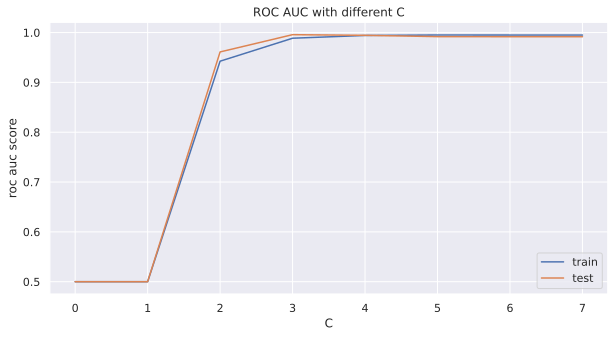

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize = (10,5))
plt.plot(train_roc_auc, label='train')
plt.plot(test_roc_auc, label='test')
plt.xlabel('C')
plt.ylabel('roc auc score')
plt.legend(loc="lower right")
plt.title('ROC AUC with different C')
plt.show()
plt.savefig('logreg.png')

In [ ]:
logreg_classifier = LogisticRegression(C=0.1, dual=False, fit_intercept=False, 
                           multi_class='auto', penalty='l1', random_state=17, 
                           solver='liblinear', tol=0.1)
logreg_classifier.fit(X_train, y_train)
test_pred = logreg_classifier.predict_proba(X_test)
roc_auc_score(y_test, test_pred[:, 1])

0.9957651869158879

### **RandomForest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(random_state= 17, n_jobs=-1)

In [ ]:
parameters = {'n_estimators': range(1, 20),
              'criterion': ['gini', 'entropy'],
              'max_depth': range(1,15),
              'min_samples_split': range(1,15),
              'min_samples_leaf': range(1,15)
}
rf_cv = RandomizedSearchCV(rf, parameters, cv=skf, scoring='roc_auc',
                           verbose=True, n_jobs=-1)
rf_cv.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.0s finished


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=5, shuffle=True),
                   error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=...
                     

In [ ]:
rf_cv.best_params_

{'criterion': 'entropy',
 'max_depth': 13,
 'min_samples_leaf': 4,
 'min_samples_split': 4,
 'n_estimators': 15}

In [ ]:
rf_cv.best_score_

0.9844597701149425

In [ ]:
y_pred = rf_cv.best_estimator_.predict_proba(X_test)
roc_auc_score(y_test, y_pred[:, 1])

0.9903621495327104

In [ ]:
train_roc_auc, test_roc_auc = [], []
for depth in  range(1, 15):
  rf = RandomForestClassifier(criterion='entropy', max_depth=depth,
                              min_samples_leaf=7, min_samples_split=8,
                              n_estimators=19, random_state= 17, n_jobs=-1)
  train_roc_auc.append(mean(cross_val_score(rf, X_train, y_train, cv=skf,
                                            scoring='roc_auc')))
  
  rf.fit(X_train, y_train)
  y_pred = rf.predict_proba(X_test)
  test_score = roc_auc_score(y_test, y_pred[:, 1])
  test_roc_auc.append(test_score)

In [ ]:
print(train_roc_auc)
print(test_roc_auc)

[0.9652390804597701, 0.975935632183908, 0.9783954022988507, 0.9840735632183908, 0.9830390804597702, 0.9837149425287356, 0.9835816091954023, 0.9835816091954023, 0.9835816091954023, 0.9835816091954023, 0.9835816091954023, 0.9835816091954023, 0.9835816091954023, 0.9835816091954023]
[0.9705753504672897, 0.9766355140186915, 0.983644859813084, 0.9855432242990654, 0.9881717289719625, 0.9874415887850466, 0.9874415887850466, 0.9874415887850466, 0.9874415887850466, 0.9874415887850466, 0.9874415887850466, 0.9874415887850466, 0.9874415887850466, 0.9874415887850466]


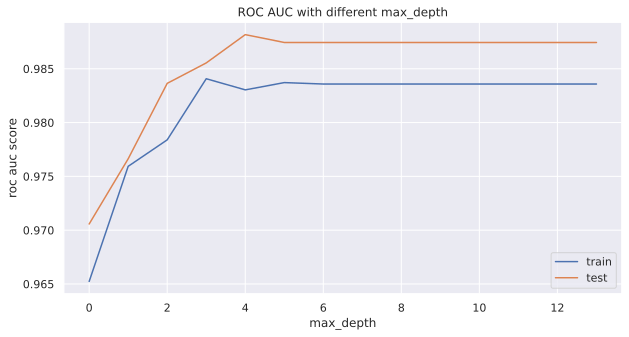

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize = (10,5))
plt.plot(train_roc_auc, label='train')
plt.plot(test_roc_auc, label='test')
plt.xlabel('max_depth')
plt.ylabel('roc auc score')
plt.legend(loc="lower right")
plt.title('ROC AUC with different max_depth')
plt.show()
plt.savefig('rf.png')

In [ ]:
rf_classifier = RandomForestClassifier(criterion='entropy', max_depth=5,
                              min_samples_leaf=7, min_samples_split=8,
                              n_estimators=19, random_state= 17, n_jobs=-1)
rf_classifier.fit(X_train, y_train)
test_pred = rf_classifier.predict_proba(X_test)
roc_auc_score(y_test, test_pred[:, 1])

0.9881717289719625

### **Catboost**

In [ ]:
!pip install -q catboost shap

     |████████████████████████████████| 69.2MB 60kB/s 
     |████████████████████████████████| 358kB 40.0MB/s 


In [ ]:
import catboost
from catboost import CatBoostClassifier
import shap

train_pool = catboost.Pool(
    X_train,
    label=y_train
)
test_pool = catboost.Pool(
    X_test,
    label=y_test
)

In [ ]:
cbc = CatBoostClassifier(random_seed=17, eval_metric='AUC')

parameters = {'iterations': [100, 250, 500, 1000],
              'depth': [1, 2, 3, 4, 5, 6],
              'l2_leaf_reg': [0.2, 0.5, 1, 3],
              'learning_rate': [0.001, 0.1, 1, 10],
              'loss_function': ['Logloss', 'CrossEntropy']
}

cbc_cv = GridSearchCV(cbc, parameters, cv=skf, scoring='roc_auc', verbose=True,
                     n_jobs=-1)
cbc_cv.fit(X_train, y_train)

Fitting 5 folds for each of 768 candidates, totalling 3840 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 428 tasks      | elapsed:   44.7s
[Parallel(n_jobs=-1)]: Done 678 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1174 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 1694 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 2308 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 2958 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 3708 tasks      | elapsed: 36.5min
[Parallel(n_jobs=-1)]: Done 3840 out of 3840 | elapsed: 43.1min finished


0:	total: 51.4ms	remaining: 51.4s
1:	total: 59.2ms	remaining: 29.6s
2:	total: 62.9ms	remaining: 20.9s
3:	total: 65.5ms	remaining: 16.3s
4:	total: 68ms	remaining: 13.5s
5:	total: 70.5ms	remaining: 11.7s
6:	total: 73.1ms	remaining: 10.4s
7:	total: 75.7ms	remaining: 9.38s
8:	total: 78.2ms	remaining: 8.61s
9:	total: 80.8ms	remaining: 7.99s
10:	total: 83.3ms	remaining: 7.49s
11:	total: 85.9ms	remaining: 7.07s
12:	total: 88.4ms	remaining: 6.71s
13:	total: 91ms	remaining: 6.41s
14:	total: 93.6ms	remaining: 6.14s
15:	total: 96.1ms	remaining: 5.91s
16:	total: 98.7ms	remaining: 5.71s
17:	total: 101ms	remaining: 5.52s
18:	total: 104ms	remaining: 5.36s
19:	total: 106ms	remaining: 5.21s
20:	total: 109ms	remaining: 5.08s
21:	total: 111ms	remaining: 4.95s
22:	total: 114ms	remaining: 4.84s
23:	total: 117ms	remaining: 4.74s
24:	total: 119ms	remaining: 4.65s
25:	total: 122ms	remaining: 4.56s
26:	total: 124ms	remaining: 4.48s
27:	total: 127ms	remaining: 4.4s
28:	total: 129ms	remaining: 4.33s
29:	total: 1

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=5, shuffle=True),
             error_score=nan,
             estimator=<catboost.core.CatBoostClassifier object at 0x7f0fcd1f7e90>,
             iid='deprecated', n_jobs=-1,
             param_grid={'depth': [1, 2, 3, 4, 5, 6],
                         'iterations': [100, 250, 500, 1000],
                         'l2_leaf_reg': [0.2, 0.5, 1, 3],
                         'learning_rate': [0.001, 0.1, 1, 10],
                         'loss_function': ['Logloss', 'CrossEntropy']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='roc_auc', verbose=True)

In [ ]:
cbc_cv.best_score_

0.9948597701149426

In [ ]:
cbc_cv.best_params_

{'depth': 4,
 'iterations': 1000,
 'l2_leaf_reg': 0.5,
 'learning_rate': 0.1,
 'loss_function': 'Logloss'}

In [ ]:
y_pred = cbc_cv.best_estimator_.predict_proba(X_test)
roc_auc_score(y_test, y_pred[:, 1])

0.9902161214953271

In [ ]:
train_roc_auc, test_roc_auc = [], []
for d in [1, 2, 3, 4, 5, 6]:
  cbc = CatBoostClassifier(random_seed=17, eval_metric='AUC', depth=d,
                          iterations=1000, l2_leaf_reg=0.5, learning_rate=0.1,
                          loss_function='Logloss')
  train_roc_auc.append(mean(cross_val_score(cbc, X_train, y_train, cv=skf,
                                            scoring='roc_auc')))
  
  cbc.fit(X_train, y_train)
  y_pred = cbc.predict_proba(X_test)
  test_score = roc_auc_score(y_test, y_pred[:, 1])
  test_roc_auc.append(test_score)

Выходные данные были обрезаны до нескольких последних строк (5000).
0:	total: 5.46ms	remaining: 5.45s
1:	total: 11ms	remaining: 5.5s
2:	total: 16.6ms	remaining: 5.5s
3:	total: 22.1ms	remaining: 5.51s
4:	total: 27.5ms	remaining: 5.47s
5:	total: 33ms	remaining: 5.46s
6:	total: 38.3ms	remaining: 5.44s
7:	total: 43.9ms	remaining: 5.45s
8:	total: 49.5ms	remaining: 5.45s
9:	total: 55.1ms	remaining: 5.45s
10:	total: 60.6ms	remaining: 5.45s
11:	total: 66.1ms	remaining: 5.44s
12:	total: 80.3ms	remaining: 6.1s
13:	total: 86.1ms	remaining: 6.07s
14:	total: 91.6ms	remaining: 6.02s
15:	total: 97.2ms	remaining: 5.98s
16:	total: 103ms	remaining: 5.93s
17:	total: 108ms	remaining: 5.9s
18:	total: 114ms	remaining: 5.87s
19:	total: 119ms	remaining: 5.84s
20:	total: 125ms	remaining: 5.81s
21:	total: 130ms	remaining: 5.78s
22:	total: 136ms	remaining: 5.76s
23:	total: 141ms	remaining: 5.74s
24:	total: 147ms	remaining: 5.72s
25:	total: 152ms	remaining: 5.7s
26:	total: 158ms	remaining: 5.68s
27:	total: 163ms	

In [ ]:
print(train_roc_auc)
print(test_roc_auc)

[0.9918850574712644, 0.9904091954022988, 0.9932459770114942, 0.9948597701149426, 0.9940597701149425, 0.9925747126436782]
[0.9887558411214953, 0.9910922897196262, 0.9908002336448598, 0.9902161214953271, 0.9915303738317757, 0.9910922897196262]


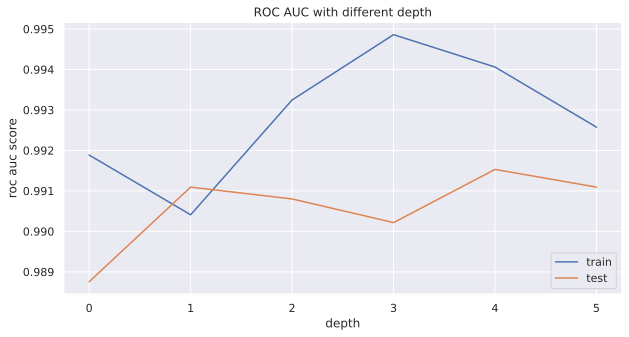

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize = (10,5))
plt.plot(train_roc_auc, label='train')
plt.plot(test_roc_auc, label='test')
plt.xlabel('depth')
plt.ylabel('roc auc score')
plt.legend(loc="lower right")
plt.title('ROC AUC with different depth')
plt.show()
plt.savefig('cb.png')

In [ ]:
cb_classifier = CatBoostClassifier(random_seed=17, eval_metric='AUC', depth=5,
                          iterations=1000, l2_leaf_reg=0.5, learning_rate=0.1,
                          loss_function='Logloss')
cb_classifier.fit(train_pool)

0:	total: 3.81ms	remaining: 3.8s
1:	total: 8.7ms	remaining: 4.34s
2:	total: 12.4ms	remaining: 4.12s
3:	total: 16.1ms	remaining: 4.01s
4:	total: 21.1ms	remaining: 4.2s
5:	total: 24.9ms	remaining: 4.12s
6:	total: 28.4ms	remaining: 4.04s
7:	total: 32ms	remaining: 3.97s
8:	total: 35.6ms	remaining: 3.92s
9:	total: 39.1ms	remaining: 3.88s
10:	total: 48.8ms	remaining: 4.39s
11:	total: 52.2ms	remaining: 4.3s
12:	total: 55.6ms	remaining: 4.22s
13:	total: 58.9ms	remaining: 4.15s
14:	total: 63.5ms	remaining: 4.17s
15:	total: 66.9ms	remaining: 4.12s
16:	total: 70.3ms	remaining: 4.06s
17:	total: 73.7ms	remaining: 4.02s
18:	total: 77ms	remaining: 3.98s
19:	total: 80.6ms	remaining: 3.95s
20:	total: 83.9ms	remaining: 3.91s
21:	total: 87.2ms	remaining: 3.88s
22:	total: 90.5ms	remaining: 3.85s
23:	total: 93.9ms	remaining: 3.82s
24:	total: 97.2ms	remaining: 3.79s
25:	total: 102ms	remaining: 3.82s
26:	total: 105ms	remaining: 3.8s
27:	total: 109ms	remaining: 3.77s
28:	total: 112ms	remaining: 3.75s
29:	tota

In [ ]:
test_pred = cb_classifier.predict_proba(test_pool)
roc_auc_score(y_test, test_pred[:, 1])

0.9915303738317757

In [ ]:
shap_info = cb_classifier.get_feature_importance(
    data=train_pool, 
    type='ShapValues', 
    verbose=10000
)
shap_values = shap_info[:,:-1]
base_values = shap_info[:,-1]

Processing trees...
128/1000 trees processed	passed time: 46.6ms	remaining time: 318ms
1000/1000 trees processed	passed time: 292ms	remaining time: 0us
Processing documents...
128/398 documents processed	passed time: 16.8ms	remaining time: 35.3ms
398/398 documents processed	passed time: 48.9ms	remaining time: 0us


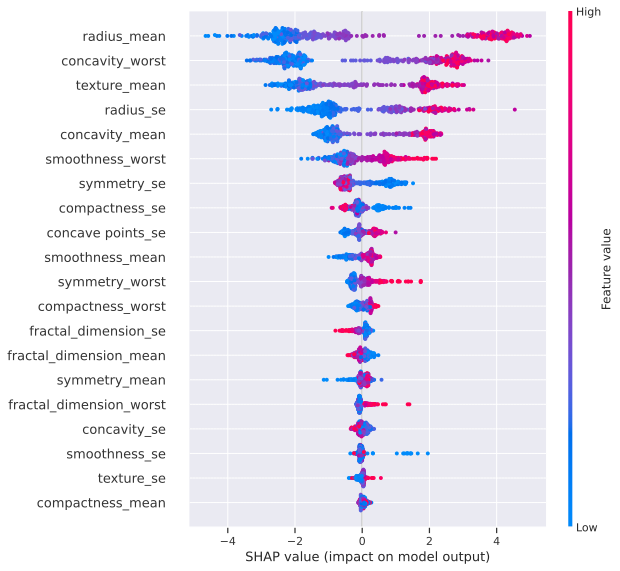

In [ ]:
shap.summary_plot(shap_values, X_train)

## Выбор наилучшей модели

In [ ]:
from sklearn.metrics import accuracy_score
import time

start_time = time.time()
y_pred_knn = knn_classifier.predict_proba(X_test)
#roc_auc_score(y_test, y_pred_knn[:, 1])
#roc_auc_score(y_holdout, holdout_pred_knn[:, 1])
knn_time = time.time() - start_time

start_time = time.time()
y_pred_logreg = logreg_classifier.predict_proba(X_test)
#roc_auc_score(y_test, y_pred_logreg[:, 1])
#roc_auc_score(y_holdout, holdout_pred_logreg[:, 1])
logreg_time = time.time() - start_time

start_time = time.time()
y_pred_rf = rf_classifier.predict_proba(X_test)
#roc_auc_score(y_test, y_pred_rf[:, 1])
#roc_auc_score(y_holdout, holdout_pred_rf[:, 1])
rf_time = time.time() - start_time

start_time = time.time()
y_pred_cbc = cb_classifier.predict_proba(test_pool)
#roc_auc_score(y_test, y_pred_cbc[:, 1])
#roc_auc_score(y_holdout, holdout_pred_cbc[:, 1])
cbc_time = time.time() - start_time

Для начала сравним roc auc score на тестовой части

In [ ]:
models = pd.DataFrame({
    'Model': ['KNN','Logistic Regression','Random Forest', 'CatBoostClassifier'],
    'ROC AUC': [roc_auc_score(y_test, y_pred_knn[:, 1]),
                      roc_auc_score(y_test, y_pred_logreg[:, 1]),
                      roc_auc_score(y_test, y_pred_rf[:, 1]),
                      roc_auc_score(y_test, y_pred_cbc[:, 1])]})

models.sort_values(by='ROC AUC', ascending=False)

,Model,ROC AUC
1,Logistic Regression,0.995765
0,KNN,0.991676
3,CatBoostClassifier,0.991530
2,Random Forest,0.988172


Логистическая регрессия показывает наилучший результат

Далее сравним точности моделей на X_test

In [ ]:
models = pd.DataFrame({
    'Model': ['KNN','Logistic Regression','Random Forest', 'CatBoostClassifier'],
    'Accuracy': [accuracy_score(y_test, knn_classifier.predict(X_test)),
                 accuracy_score(y_test, logreg_classifier.predict(X_test)),
                 accuracy_score(y_test, rf_classifier.predict(X_test)),
                 accuracy_score(y_test, cb_classifier.predict(X_test))]})

models.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy
1,Logistic Regression,0.964912
3,CatBoostClassifier,0.959064
0,KNN,0.953216
2,Random Forest,0.935673


Наиболее точной оказалась логистическая регрессия

Далее проведем сравнение времени, которое уходит на предсказание тестовой выборки

In [ ]:
models = pd.DataFrame({
    'Model': ['K - Nearest Neighbors','Logistic Regression','Random Forest', 'Gradient Boosting'],
    'Time': [knn_time, logreg_time, rf_time, cbc_time]})

models.sort_values(by='Time', ascending=True)

,Model,Time
3,Gradient Boosting,0.000793
1,Logistic Regression,0.001155
0,K - Nearest Neighbors,0.031045
2,Random Forest,0.109321


По веремени предсказания самой быстрой оказалась Логистическая регрессия

## Вывод

В совокупности всех приведенных сравнений, наилучшая модель в рамках данной задачи - Logistic Regression

Результат:

- roc_auc_score = 0.995765
- accuracy_score = 0.964912